**Module Paths**

In [1]:
import os

os.chdir("./../..")

**Device**

In [2]:
from utils.device import get_device

device = get_device()
device

device(type='mps')

# Deep Convolutional GANs

Let's build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored in 2016 and has seen impressive results in generating new images; read the [original paper, here](https://arxiv.org/pdf/1511.06434.pdf).

We'll be training DCGAN on the [CIFAR10](https://www.cs.toronto.edu/~kriz/cifar.html) dataset. These are color images of different classes, such as airplanes, dogs or trucks. This dataset is much more complex and diverse than the MNIST dataset and justifies the use of the DCGAN architecture.

<img src='../assets/cifar10_data.png' width=80% />


So, our goal is to create a DCGAN that can generate new, realistic-looking images. We'll go through the following steps to do this:
* Load in and pre-process the CIFAR10 dataset
* **Define discriminator and generator networks**
* Train these adversarial networks
* Visualize the loss over time and some sample, generated images

In this notebook, we will focus on defining the networks.

#### Deeper Convolutional Networks

Since this dataset is more complex than our MNIST data, we'll need a deeper network to accurately identify patterns in these images and be able to generate new ones. Specifically, we'll use a series of convolutional or transpose convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get these convolutional networks to train. 

Besides these changes in network structure, training the discriminator and generator networks should be the same as before. That is, the discriminator will alternate training on real and fake (generated) images, and the generator will aim to trick the discriminator into thinking that its generated images are real!

## Discriminator

Let's build the discriminator. This is a convolutional classifier like we've built before, only without any maxpooling layers. 
* The inputs to the discriminator are 32x32x3 tensor images
* We'll want a few convolutional, hidden layers
* Then a fully connected layer for the output; as before, we want a sigmoid output, but we'll add that in the loss function, [BCEWithLogitsLoss](https://pytorch.org/docs/stable/nn.html#bcewithlogitsloss), later

<img src='../assets/conv_discriminator.png' width=80%/>

For the depths of the convolutional layers I suggest starting with 32 filters in the first layer, then double that depth as we add layers (to 64, 128, etc.). Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpooling layers.

We'll also want to use batch normalization with [nn.BatchNorm2d](https://pytorch.org/docs/stable/nn.html#batchnorm2d) on each layer **except** the first convolutional layer and final, linear output layer. 

#### Helper `ConvBlock` module 

In general, each layer should look something like convolution > batch norm > leaky ReLU, and so we'll define a **custom torch Module** to put these layers together. This module will create a sequential series of a convolutional + an optional batch norm layer. 

Note: It is also suggested that we use a **kernel_size of 4** and a **stride of 2** for strided convolutions.

In [3]:
import torch
import torch.nn as nn

In [4]:
class ConvBlock(nn.Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """

    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int,
        stride=2,
        padding=1,
        batch_norm: bool = True,
    ):
        super(ConvBlock, self).__init__()

        self.conv = nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size,
            stride=stride,
            padding=padding,
            bias=False,
        )
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [5]:
class Discriminator(nn.Module):
    """
    The discriminator model adapted from the DCGAN paper. It should only contains a few layers.
    args:
    - conv_dim: control the number of filters
    """

    def __init__(self, conv_dim: int):
        super(Discriminator, self).__init__()

        # complete init function
        self.conv_dim = conv_dim

        # 32x32 input
        self.conv1 = ConvBlock(
            3, conv_dim, 4, 2, 1, batch_norm=False
        )  # first layer, no batch_norm
        # 16x16 out
        self.conv2 = ConvBlock(conv_dim, conv_dim * 2, 4, 2, 1)
        # 8x8 out
        self.conv3 = ConvBlock(conv_dim * 2, conv_dim * 4, 4, 2, 1)
        # 4x4 out

        self.flatten = nn.Flatten()
        # final, fully-connected layer
        self.fc = nn.Linear(conv_dim * 4 * 4 * 4, 1)
        self.activation = nn.Sigmoid()

    def forward(self, x):
        # all hidden layers + leaky relu activation
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        # flatten
        x = self.flatten(x)
        # final output layer
        x = self.fc(x)
        x = self.activation(x)
        return x

## Generator

Next, build the generator network. The input will be our noise vector `z`, as before. And, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our CIFAR10 images.

<img src='../assets/conv_generator.png' width=80% />

What's new here is we'll use transpose convolutional layers to create our new images. 
* The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x512. 
* Then, we use batch normalization and a leaky ReLU activation. 
* Next is a series of [transpose convolutional layers](https://pytorch.org/docs/stable/nn.html#convtranspose2d), where we typically halve the depth and double the width and height of the previous layer. 
* And, we'll apply batch normalization and ReLU to all but the last of these hidden layers. Where we will just apply a `tanh` activation.

#### Helper `DeconvBlock` module

For each of these layers, the general scheme is transpose convolution > batch norm > ReLU, and so we'll define a function to put these layers together. This function will create a sequential series of a transpose convolutional + an optional batch norm layer. We'll create these using PyTorch's Sequential container, which takes in a list of layers and creates layers according to the order that they are passed in to the Sequential constructor.

Note: It is also suggested that we use a **kernel_size of 4** and a **stride of 2** for transpose convolutions.

In [6]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """

    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int,
        stride: int,
        padding: int,
        batch_norm: bool = True,
    ):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(
            in_channels, out_channels, kernel_size, stride, padding, bias=False
        )
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [7]:
class Generator(nn.Module):
    """
    The generator model adapted from DCGAN
    args:
    - latent_dim: dimension of the latent vector
    - conv_dim: control the number of filters in the convtranspose layers
    """

    def __init__(self, latent_dim: int, conv_dim: int = 32):
        super(Generator, self).__init__()
        # transpose conv layers
        self.fc = nn.Sequential(
            nn.Linear(latent_dim, conv_dim * 16 * 4 * 4),
            nn.BatchNorm1d(conv_dim * 16 * 4 * 4),
            nn.ReLU(True),
            nn.Unflatten(1, (conv_dim * 16, 4, 4)),
        )
        self.deconv1 = DeconvBlock(conv_dim * 16, conv_dim * 8, 4, 2, 1)
        self.deconv2 = DeconvBlock(conv_dim * 8, conv_dim * 4, 4, 2, 1)
        self.deconv3 = nn.ConvTranspose2d(conv_dim * 4, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()

    def forward(self, x):
        x = self.fc(x)
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.last_activation(x)
        return x

## Load the Data

In [8]:
from torchvision import transforms as T

train_transform = T.Compose(
    [
        T.ToTensor(),
        T.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),  # Scale to [-1, 1]
    ]
)

In [9]:
from data import DatasetWrapper

dataset_wrapper = DatasetWrapper(
    dataset_name="CIFAR10",
    root="./gan/cifar/data",
    train_transform=train_transform,
    download=True,
    train_ratio=1,
)

Files already downloaded and verified
Files already downloaded and verified


## Create DataLoader

In [10]:
from data import DataLoaderWrapper

dataset, _, _ = dataset_wrapper.get_datasets()

data_loader_wrapper = DataLoaderWrapper(dataset=dataset, batch_size=128, num_workers=4)

data_loader = data_loader_wrapper.get_loader()

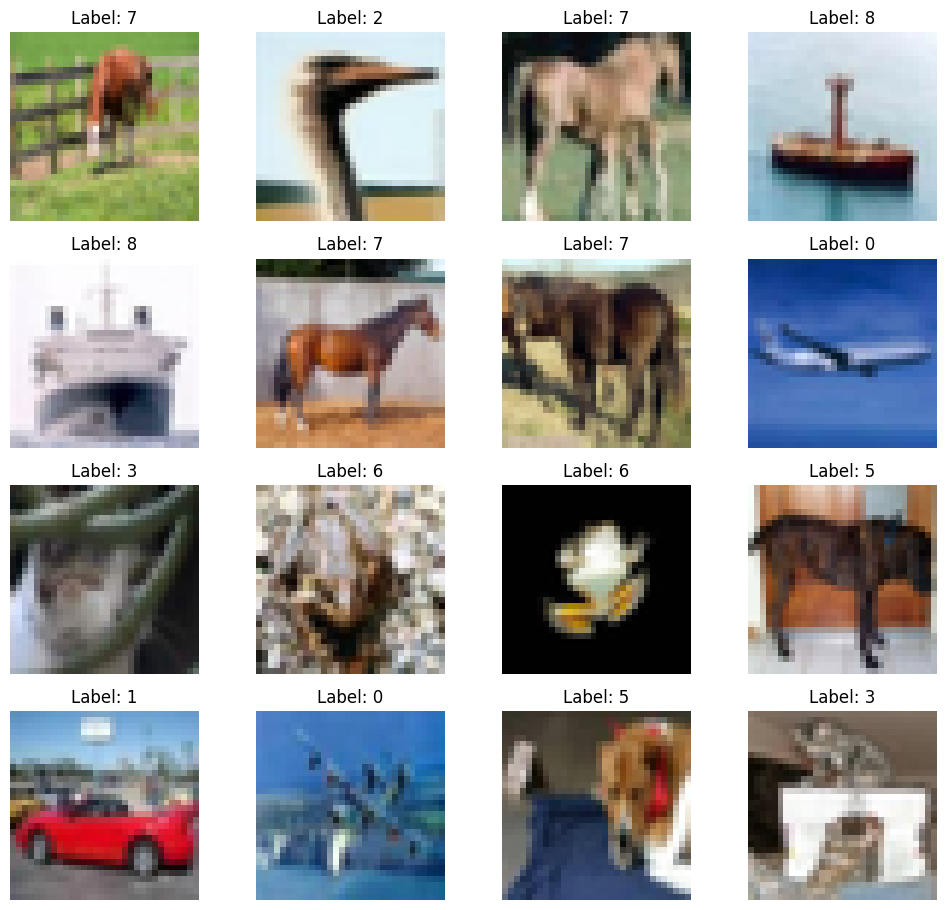

In [11]:
data_loader_wrapper.display_sample_images()

# Model hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out new hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [12]:
# Hyperparameters
lr = 0.0002
beta1 = 0.5
beta2 = 0.999

## Initialize model, criterion, optimizer

In [13]:
# define hyperparams
conv_dim = 32
z_size = 100

# define discriminator and generator
D = Discriminator(conv_dim)
G = Generator(latent_dim=z_size, conv_dim=conv_dim)

print(D)
print()
print(G)

Discriminator(
  (conv1): ConvBlock(
    (conv): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (activation): LeakyReLU(negative_slope=0.2)
  )
  (conv2): ConvBlock(
    (conv): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): LeakyReLU(negative_slope=0.2)
  )
  (conv3): ConvBlock(
    (conv): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): LeakyReLU(negative_slope=0.2)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc): Linear(in_features=2048, out_features=1, bias=True)
  (activation): Sigmoid()
)

Generator(
  (fc): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=True)
    (1): BatchNorm1d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stat

In [14]:
from optimize import OptimizerWrapper

d_optimizer = OptimizerWrapper(D, "adam", lr=lr, betas=(beta1, beta2)).get_optimizer()
g_optimizer = OptimizerWrapper(G, "adam", lr=lr, betas=(beta1, beta2)).get_optimizer()

## Train the model

In [15]:
from trainer import GANTrainer

trainer = GANTrainer(
    G,
    D,
    data_loader,
    g_optimizer,
    d_optimizer,
    z_size,
    device=device,
    is_conv=True,
    image_shape=(32, 32, 3),
)

2024-11-04 20:16:18 | Batch 0/391 | d_loss: 1.5483 | g_loss: 0.4917
2024-11-04 20:16:32 | Batch 100/391 | d_loss: 1.1175 | g_loss: 0.6910
2024-11-04 20:16:46 | Batch 200/391 | d_loss: 1.1108 | g_loss: 0.6922
2024-11-04 20:17:00 | Batch 300/391 | d_loss: 1.1090 | g_loss: 0.6925


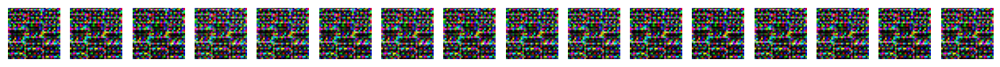

2024-11-04 20:17:40 | Batch 0/391 | d_loss: 1.1087 | g_loss: 0.6927
2024-11-04 20:17:54 | Batch 100/391 | d_loss: 1.1754 | g_loss: 0.6931
2024-11-04 20:18:08 | Batch 200/391 | d_loss: 1.1065 | g_loss: 0.6931
2024-11-04 20:18:22 | Batch 300/391 | d_loss: 1.1065 | g_loss: 0.6931


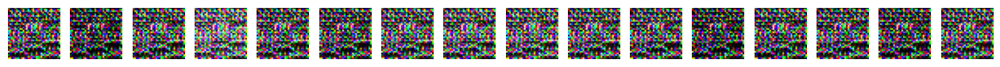

2024-11-04 20:19:02 | Batch 0/391 | d_loss: 1.1069 | g_loss: 0.6931
2024-11-04 20:19:16 | Batch 100/391 | d_loss: 1.1066 | g_loss: 0.6931
2024-11-04 20:19:30 | Batch 200/391 | d_loss: 1.1065 | g_loss: 0.6931
2024-11-04 20:19:44 | Batch 300/391 | d_loss: 1.1065 | g_loss: 0.6931


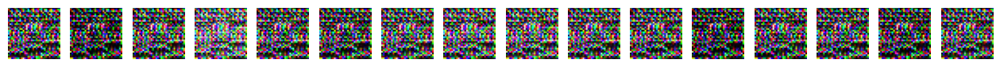

2024-11-04 20:20:23 | Batch 0/391 | d_loss: 1.1064 | g_loss: 0.6931
2024-11-04 20:20:37 | Batch 100/391 | d_loss: 1.1065 | g_loss: 0.6931
2024-11-04 20:20:51 | Batch 200/391 | d_loss: 1.1065 | g_loss: 0.6931
2024-11-04 20:21:05 | Batch 300/391 | d_loss: 1.1064 | g_loss: 0.6931


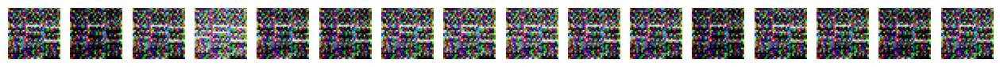

2024-11-04 20:21:44 | Batch 0/391 | d_loss: 1.1065 | g_loss: 0.6931
2024-11-04 20:21:58 | Batch 100/391 | d_loss: 1.1064 | g_loss: 0.6931
2024-11-04 20:22:12 | Batch 200/391 | d_loss: 1.1071 | g_loss: 0.6931
2024-11-04 20:22:26 | Batch 300/391 | d_loss: 1.1066 | g_loss: 0.6931


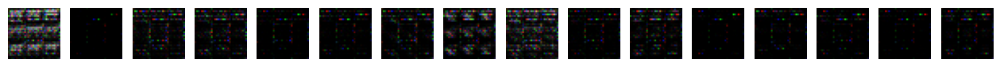

2024-11-04 20:23:06 | Batch 0/391 | d_loss: 1.1670 | g_loss: 0.6678
2024-11-04 20:23:20 | Batch 100/391 | d_loss: 1.1355 | g_loss: 0.6921
2024-11-04 20:23:34 | Batch 200/391 | d_loss: 1.1357 | g_loss: 0.6908
2024-11-04 20:23:48 | Batch 300/391 | d_loss: 1.3139 | g_loss: 0.6914


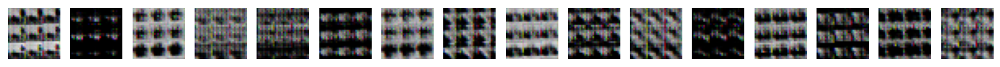

2024-11-04 20:24:28 | Batch 0/391 | d_loss: 1.1485 | g_loss: 0.6926
2024-11-04 20:24:42 | Batch 100/391 | d_loss: 1.1922 | g_loss: 0.6928
2024-11-04 20:24:56 | Batch 200/391 | d_loss: 1.1966 | g_loss: 0.6557
2024-11-04 20:25:10 | Batch 300/391 | d_loss: 1.1070 | g_loss: 0.6931


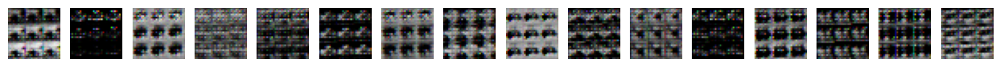

2024-11-04 20:25:49 | Batch 0/391 | d_loss: 1.1067 | g_loss: 0.6929
2024-11-04 20:26:03 | Batch 100/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:26:17 | Batch 200/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:26:31 | Batch 300/391 | d_loss: 1.3863 | g_loss: 0.6931


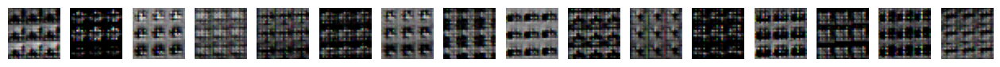

2024-11-04 20:27:11 | Batch 0/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:27:25 | Batch 100/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:27:39 | Batch 200/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:27:53 | Batch 300/391 | d_loss: 1.3863 | g_loss: 0.6931


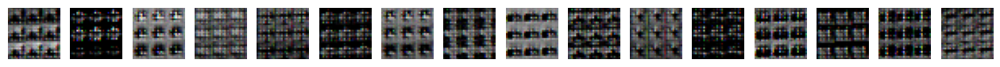

2024-11-04 20:28:33 | Batch 0/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:28:47 | Batch 100/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:29:01 | Batch 200/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:29:15 | Batch 300/391 | d_loss: 1.3862 | g_loss: 0.6931


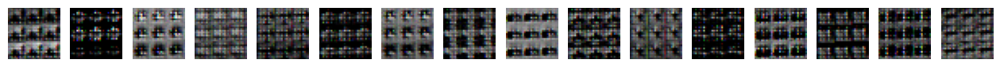

2024-11-04 20:29:54 | Batch 0/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:30:08 | Batch 100/391 | d_loss: 1.3863 | g_loss: 0.6931
2024-11-04 20:30:22 | Batch 200/391 | d_loss: 1.3862 | g_loss: 0.6931
2024-11-04 20:30:36 | Batch 300/391 | d_loss: 1.3862 | g_loss: 0.6931


In [16]:
# Train the model for a few epochs
trainer.train(num_epochs=100, smooth=True, view_samples=True)

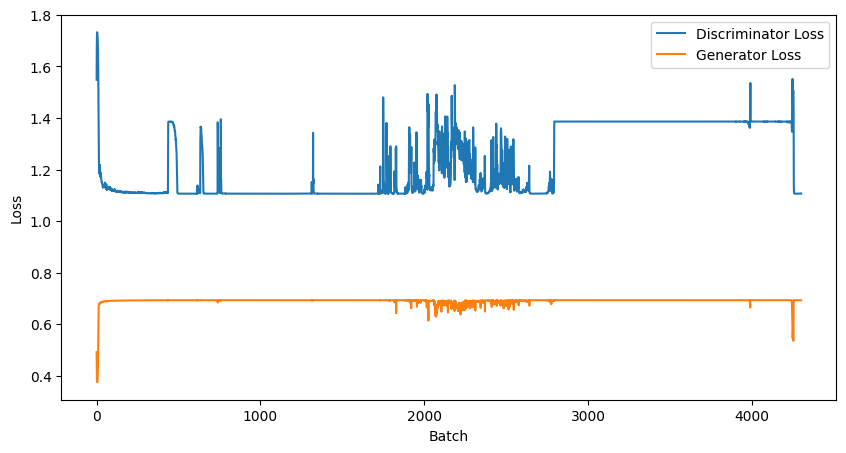

In [17]:
# Plot the trainer metrics
trainer.plot_metrics()

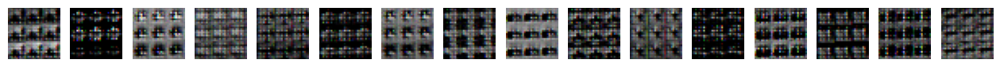

In [18]:
# Visualizing the final samples
trainer.view_samples(-1)

# Stability and Training Improvements for DCGAN on CIFAR10

To improve the stability and effectiveness of training, especially to prevent mode collapse, the following modifications have been implemented:

1. Weight Initialization: Initialize the model weights with a normal distribution for convolutional layers (mean=0, std=0.02) and for batch normalization layers (mean=1, std=0.02). This helps stabilize training early on.
2. Lower Learning Rate and Optimizer Settings: Use a lower learning rate (0.0001) for the Adam optimizer.
3. Add Noise to Labels: Introduce a small amount of noise to both real and fake labels to make the discriminator’s job harder, which can improve generalization.
4. Add Instance Noise: Add Gaussian noise to both real and generated images to prevent the discriminator from overpowering the generator. This is known as “instance noise” and can improve training stability.
5. Spectral Normalization: Apply spectral normalization to the discriminator’s convolutional layers to constrain the Lipschitz constant of each layer, preventing the discriminator from dominating the generator.
6. Training the generator more frequently than the discriminator (e.g., train the generator for two steps for every one step of the discriminator).

With these adjustments, along with setting a patience of 15 for early stopping, it appears we should improve the model’s learning performance on the CIFAR10 dataset.

In [16]:
# Hyperparameters
lr = 0.0001
label_noise = 0.1
instance_noise = 0.1
g_updates = 2
patience = 15

In [17]:
from model.helper import initialize_weights

In [18]:
from torch.nn.utils import spectral_norm


class ConvBlock(nn.Module):
    """
    A convolutional block made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """

    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int,
        stride=2,
        padding=1,
        batch_norm: bool = True,
    ):
        super(ConvBlock, self).__init__()

        # Apply spectral normalization to the Conv2d layer
        self.conv = spectral_norm(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride=stride,
                padding=padding,
                bias=False,
            )
        )

        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)

        self.activation = nn.LeakyReLU(0.2)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x


class Discriminator(nn.Module):
    """
    The discriminator model adapted from the DCGAN paper.
    args:
    - conv_dim: control the number of filters
    """

    def __init__(self, conv_dim: int):
        super(Discriminator, self).__init__()

        self.conv_dim = conv_dim

        # 32x32 input
        self.conv1 = ConvBlock(
            3, conv_dim, 4, 2, 1, batch_norm=False
        )  # first layer, no batch_norm
        # 16x16 out
        self.conv2 = ConvBlock(conv_dim, conv_dim * 2, 4, 2, 1)
        # 8x8 out
        self.conv3 = ConvBlock(conv_dim * 2, conv_dim * 4, 4, 2, 1)
        # 4x4 out

        self.flatten = nn.Flatten()

        # Apply spectral normalization to the fully-connected layer
        self.fc = spectral_norm(nn.Linear(conv_dim * 4 * 4 * 4, 1))
        self.activation = nn.Sigmoid()

    def forward(self, x):
        # All hidden layers + leaky relu activation
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        # Flatten
        x = self.flatten(x)

        # Final output layer with spectral normalization
        x = self.fc(x)
        x = self.activation(x)

        return x

In [19]:
# define hyperparams
conv_dim = 32
z_size = 100

# define discriminator and generator
D = Discriminator(conv_dim)
G = Generator(latent_dim=z_size, conv_dim=conv_dim)

In [20]:
D = D.apply(initialize_weights)
G = G.apply(initialize_weights)

In [24]:
from trainer import GANTrainer

trainer = GANTrainer(
    G,
    D,
    data_loader,
    g_optimizer,
    d_optimizer,
    z_size,
    device=device,
    is_conv=True,
    image_shape=(32, 32, 3),
)

2024-11-04 21:29:22 | Batch 0/391 | d_loss: 1.5568 | g_loss: 0.4229 (after 2 updates)
2024-11-04 21:29:45 | Batch 100/391 | d_loss: 1.5634 | g_loss: 0.4205 (after 2 updates)
2024-11-04 21:30:07 | Batch 200/391 | d_loss: 1.5687 | g_loss: 0.4230 (after 2 updates)
2024-11-04 21:30:29 | Batch 300/391 | d_loss: 1.5780 | g_loss: 0.4243 (after 2 updates)


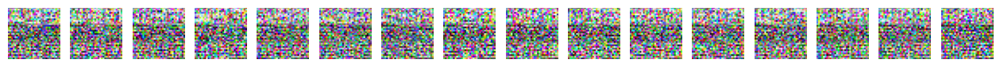

2024-11-04 21:31:16 | Batch 0/391 | d_loss: 1.5691 | g_loss: 0.4183 (after 2 updates)
2024-11-04 21:31:38 | Batch 100/391 | d_loss: 1.5664 | g_loss: 0.4168 (after 2 updates)
2024-11-04 21:32:00 | Batch 200/391 | d_loss: 1.5728 | g_loss: 0.4221 (after 2 updates)
2024-11-04 21:32:22 | Batch 300/391 | d_loss: 1.5649 | g_loss: 0.4197 (after 2 updates)


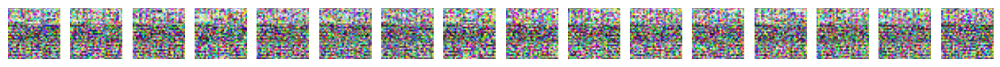

2024-11-04 21:33:09 | Batch 0/391 | d_loss: 1.5589 | g_loss: 0.4263 (after 2 updates)
2024-11-04 21:33:31 | Batch 100/391 | d_loss: 1.5949 | g_loss: 0.4206 (after 2 updates)
2024-11-04 21:33:53 | Batch 200/391 | d_loss: 1.5771 | g_loss: 0.4211 (after 2 updates)
2024-11-04 21:34:15 | Batch 300/391 | d_loss: 1.5610 | g_loss: 0.4157 (after 2 updates)


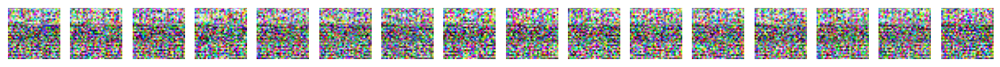

2024-11-04 21:35:02 | Batch 0/391 | d_loss: 1.5665 | g_loss: 0.4235 (after 2 updates)
2024-11-04 21:35:24 | Batch 100/391 | d_loss: 1.5851 | g_loss: 0.4247 (after 2 updates)
2024-11-04 21:35:46 | Batch 200/391 | d_loss: 1.5755 | g_loss: 0.4154 (after 2 updates)
2024-11-04 21:36:08 | Batch 300/391 | d_loss: 1.5652 | g_loss: 0.4251 (after 2 updates)


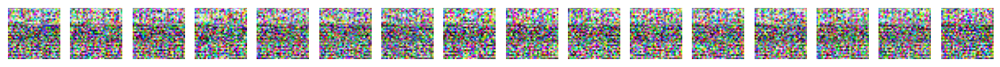

2024-11-04 21:36:54 | Batch 0/391 | d_loss: 1.5682 | g_loss: 0.4213 (after 2 updates)
2024-11-04 21:37:16 | Batch 100/391 | d_loss: 1.5551 | g_loss: 0.4287 (after 2 updates)
2024-11-04 21:37:38 | Batch 200/391 | d_loss: 1.5543 | g_loss: 0.4261 (after 2 updates)
2024-11-04 21:38:00 | Batch 300/391 | d_loss: 1.5728 | g_loss: 0.4226 (after 2 updates)


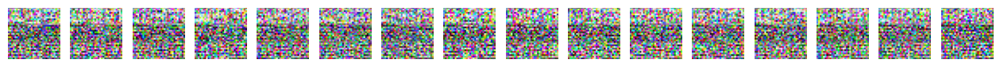

2024-11-04 21:38:47 | Batch 0/391 | d_loss: 1.5709 | g_loss: 0.4205 (after 2 updates)
2024-11-04 21:39:09 | Batch 100/391 | d_loss: 1.5747 | g_loss: 0.4214 (after 2 updates)
2024-11-04 21:39:31 | Batch 200/391 | d_loss: 1.5627 | g_loss: 0.4217 (after 2 updates)
2024-11-04 21:39:53 | Batch 300/391 | d_loss: 1.5567 | g_loss: 0.4222 (after 2 updates)


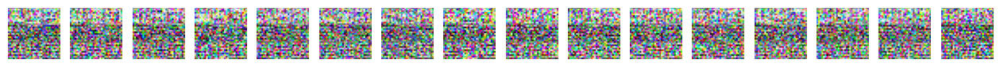

2024-11-04 21:40:40 | Batch 0/391 | d_loss: 1.5510 | g_loss: 0.4256 (after 2 updates)
2024-11-04 21:41:02 | Batch 100/391 | d_loss: 1.5666 | g_loss: 0.4222 (after 2 updates)
2024-11-04 21:41:24 | Batch 200/391 | d_loss: 1.5773 | g_loss: 0.4163 (after 2 updates)
2024-11-04 21:41:46 | Batch 300/391 | d_loss: 1.5753 | g_loss: 0.4206 (after 2 updates)


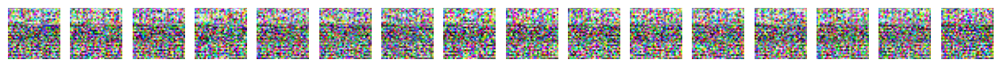

2024-11-04 21:42:34 | Batch 0/391 | d_loss: 1.5591 | g_loss: 0.4221 (after 2 updates)
2024-11-04 21:42:56 | Batch 100/391 | d_loss: 1.5796 | g_loss: 0.4240 (after 2 updates)
2024-11-04 21:43:18 | Batch 200/391 | d_loss: 1.5576 | g_loss: 0.4209 (after 2 updates)
2024-11-04 21:43:40 | Batch 300/391 | d_loss: 1.5629 | g_loss: 0.4233 (after 2 updates)


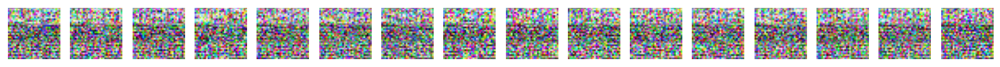

2024-11-04 21:44:27 | Batch 0/391 | d_loss: 1.5637 | g_loss: 0.4209 (after 2 updates)
2024-11-04 21:44:49 | Batch 100/391 | d_loss: 1.5607 | g_loss: 0.4210 (after 2 updates)
2024-11-04 21:45:11 | Batch 200/391 | d_loss: 1.5531 | g_loss: 0.4242 (after 2 updates)
2024-11-04 21:45:33 | Batch 300/391 | d_loss: 1.5786 | g_loss: 0.4226 (after 2 updates)


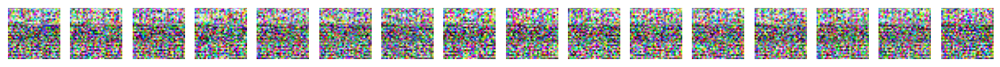

2024-11-04 21:46:20 | Batch 0/391 | d_loss: 1.5555 | g_loss: 0.4219 (after 2 updates)
2024-11-04 21:46:42 | Batch 100/391 | d_loss: 1.5738 | g_loss: 0.4204 (after 2 updates)
2024-11-04 21:47:05 | Batch 200/391 | d_loss: 1.5815 | g_loss: 0.4208 (after 2 updates)
2024-11-04 22:02:14 | Batch 300/391 | d_loss: 1.5720 | g_loss: 0.4198 (after 2 updates)


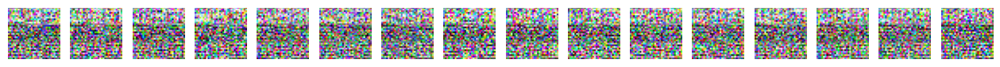

2024-11-04 22:03:01 | Batch 0/391 | d_loss: 1.5655 | g_loss: 0.4223 (after 2 updates)
2024-11-04 22:03:23 | Batch 100/391 | d_loss: 1.5666 | g_loss: 0.4232 (after 2 updates)
2024-11-04 22:03:45 | Batch 200/391 | d_loss: 1.5603 | g_loss: 0.4174 (after 2 updates)
2024-11-04 22:04:08 | Batch 300/391 | d_loss: 1.5713 | g_loss: 0.4253 (after 2 updates)


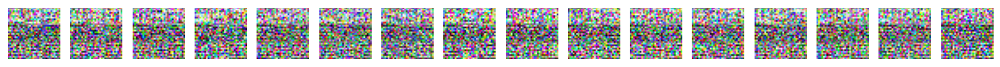

2024-11-04 22:04:54 | Batch 0/391 | d_loss: 1.5774 | g_loss: 0.4232 (after 2 updates)
2024-11-04 22:05:17 | Batch 100/391 | d_loss: 1.5718 | g_loss: 0.4249 (after 2 updates)
2024-11-04 22:05:39 | Batch 200/391 | d_loss: 1.5659 | g_loss: 0.4202 (after 2 updates)
2024-11-04 22:06:02 | Batch 300/391 | d_loss: 1.5572 | g_loss: 0.4213 (after 2 updates)


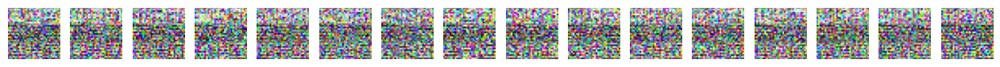

2024-11-04 22:06:49 | Batch 0/391 | d_loss: 1.5662 | g_loss: 0.4201 (after 2 updates)
2024-11-04 22:07:11 | Batch 100/391 | d_loss: 1.5584 | g_loss: 0.4264 (after 2 updates)
2024-11-04 22:07:33 | Batch 200/391 | d_loss: 1.5490 | g_loss: 0.4200 (after 2 updates)
2024-11-04 22:07:55 | Batch 300/391 | d_loss: 1.5778 | g_loss: 0.4222 (after 2 updates)


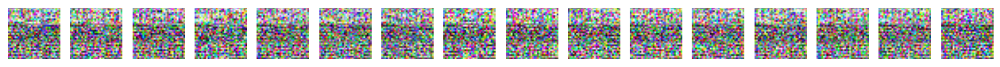

2024-11-04 22:08:42 | Batch 0/391 | d_loss: 1.5721 | g_loss: 0.4246 (after 2 updates)
2024-11-04 22:09:05 | Batch 100/391 | d_loss: 1.5589 | g_loss: 0.4272 (after 2 updates)
2024-11-04 22:09:27 | Batch 200/391 | d_loss: 1.5824 | g_loss: 0.4253 (after 2 updates)
2024-11-04 22:09:49 | Batch 300/391 | d_loss: 1.5837 | g_loss: 0.4249 (after 2 updates)


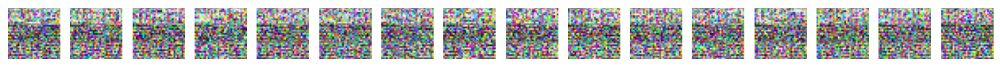

2024-11-04 22:10:36 | Batch 0/391 | d_loss: 1.5740 | g_loss: 0.4251 (after 2 updates)
2024-11-04 22:10:58 | Batch 100/391 | d_loss: 1.5824 | g_loss: 0.4205 (after 2 updates)
2024-11-04 22:11:20 | Batch 200/391 | d_loss: 1.5699 | g_loss: 0.4186 (after 2 updates)
2024-11-04 22:11:42 | Batch 300/391 | d_loss: 1.5873 | g_loss: 0.4249 (after 2 updates)


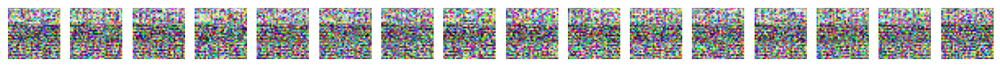

2024-11-04 22:12:29 | Batch 0/391 | d_loss: 1.5744 | g_loss: 0.4176 (after 2 updates)
2024-11-04 22:12:51 | Batch 100/391 | d_loss: 1.5689 | g_loss: 0.4226 (after 2 updates)
2024-11-04 22:13:12 | Batch 200/391 | d_loss: 1.5989 | g_loss: 0.4210 (after 2 updates)
2024-11-04 22:13:34 | Batch 300/391 | d_loss: 1.5889 | g_loss: 0.4221 (after 2 updates)


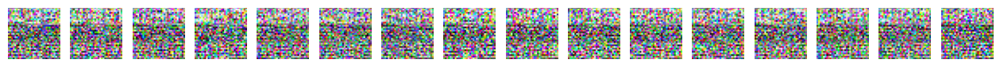

2024-11-04 22:14:21 | Batch 0/391 | d_loss: 1.5756 | g_loss: 0.4214 (after 2 updates)
2024-11-04 22:14:43 | Batch 100/391 | d_loss: 1.5519 | g_loss: 0.4213 (after 2 updates)
2024-11-04 22:15:05 | Batch 200/391 | d_loss: 1.5663 | g_loss: 0.4245 (after 2 updates)
2024-11-04 22:15:27 | Batch 300/391 | d_loss: 1.5608 | g_loss: 0.4232 (after 2 updates)


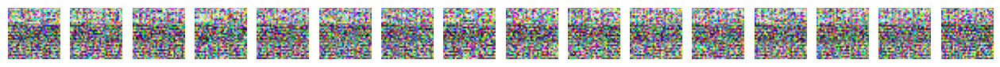

2024-11-04 22:16:15 | Batch 0/391 | d_loss: 1.5785 | g_loss: 0.4176 (after 2 updates)
2024-11-04 22:16:37 | Batch 100/391 | d_loss: 1.5725 | g_loss: 0.4292 (after 2 updates)
2024-11-04 22:16:59 | Batch 200/391 | d_loss: 1.5394 | g_loss: 0.4241 (after 2 updates)
2024-11-04 22:17:21 | Batch 300/391 | d_loss: 1.5715 | g_loss: 0.4248 (after 2 updates)


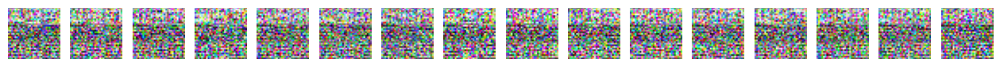

2024-11-04 22:18:08 | Batch 0/391 | d_loss: 1.5866 | g_loss: 0.4213 (after 2 updates)
2024-11-04 22:18:30 | Batch 100/391 | d_loss: 1.5671 | g_loss: 0.4216 (after 2 updates)
2024-11-04 22:18:52 | Batch 200/391 | d_loss: 1.5773 | g_loss: 0.4221 (after 2 updates)
2024-11-04 22:19:14 | Batch 300/391 | d_loss: 1.5762 | g_loss: 0.4255 (after 2 updates)


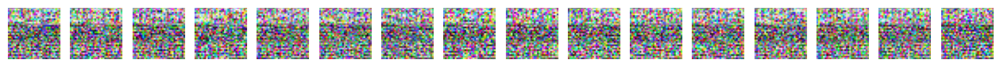

2024-11-04 22:20:02 | Batch 0/391 | d_loss: 1.5723 | g_loss: 0.4243 (after 2 updates)
2024-11-04 22:20:23 | Batch 100/391 | d_loss: 1.5540 | g_loss: 0.4259 (after 2 updates)
2024-11-04 22:20:45 | Batch 200/391 | d_loss: 1.5648 | g_loss: 0.4197 (after 2 updates)
2024-11-04 22:21:07 | Batch 300/391 | d_loss: 1.5555 | g_loss: 0.4210 (after 2 updates)


In [25]:
trainer.train(
    num_epochs=100,
    smooth=True,
    patience=patience,
    view_samples=True,
    g_updates=g_updates,
    label_noise=label_noise,
    instance_noise=instance_noise,
)

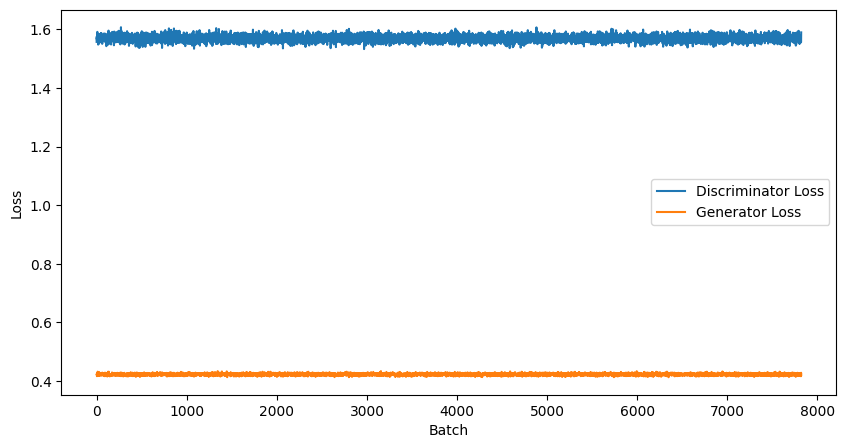

In [26]:
# Plot the trainer metrics
trainer.plot_metrics()

# Increasing Latent Dimension and Adjusting Learning Rates

- Increase z_size to 512: Expanding the noise vector’s dimensionality provides the generator with more capacity to capture diverse features, potentially improving the variety and quality of generated samples.
- Adjust Learning Rates:
- Generator (lr=0.0002): A higher learning rate encourages faster adaptation to match the discriminator’s performance.
- Discriminator (lr=0.00005): A lower learning rate helps prevent the discriminator from overpowering the generator, promoting balanced training.

In [27]:
# Hyperparameters
g_lr = 0.0002
d_lr = 0.00005
label_noise = 0.1
instance_noise = 0.1
g_updates = 2
patience = 5
z_size = 512

In [28]:
# define discriminator and generator
D = Discriminator(conv_dim)
G = Generator(latent_dim=z_size, conv_dim=conv_dim)

D = D.apply(initialize_weights)
G = G.apply(initialize_weights)

In [29]:
from optimize import OptimizerWrapper

d_optimizer = OptimizerWrapper(D, "adam", lr=d_lr, betas=(beta1, beta2)).get_optimizer()
g_optimizer = OptimizerWrapper(G, "adam", lr=g_lr, betas=(beta1, beta2)).get_optimizer()

In [30]:
trainer = GANTrainer(
    G,
    D,
    data_loader,
    g_optimizer,
    d_optimizer,
    z_size,
    device=device,
    is_conv=True,
    image_shape=(32, 32, 3),
)

2024-11-04 22:22:36 | Batch 0/391 | d_loss: 1.5803 | g_loss: 0.3261 (after 2 updates)
2024-11-04 22:22:59 | Batch 100/391 | d_loss: 1.7218 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:23:22 | Batch 200/391 | d_loss: 1.7424 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:23:45 | Batch 300/391 | d_loss: 1.7292 | g_loss: 0.3133 (after 2 updates)


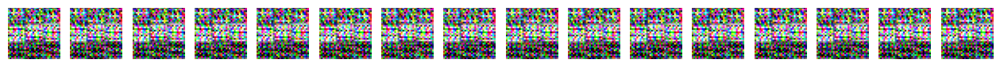

2024-11-04 22:24:33 | Batch 0/391 | d_loss: 1.6975 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:24:56 | Batch 100/391 | d_loss: 1.7110 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:25:19 | Batch 200/391 | d_loss: 1.7322 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:25:43 | Batch 300/391 | d_loss: 1.7327 | g_loss: 0.3133 (after 2 updates)


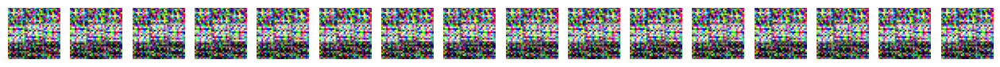

2024-11-04 22:26:31 | Batch 0/391 | d_loss: 1.7269 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:26:54 | Batch 100/391 | d_loss: 1.7385 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:27:17 | Batch 200/391 | d_loss: 1.7490 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:27:40 | Batch 300/391 | d_loss: 1.7366 | g_loss: 0.3133 (after 2 updates)


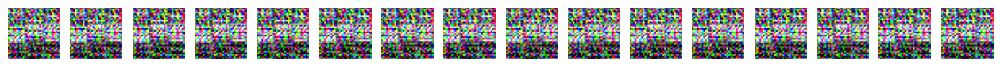

2024-11-04 22:28:28 | Batch 0/391 | d_loss: 1.7417 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:28:51 | Batch 100/391 | d_loss: 1.7083 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:29:14 | Batch 200/391 | d_loss: 1.7602 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:29:37 | Batch 300/391 | d_loss: 1.7545 | g_loss: 0.3133 (after 2 updates)


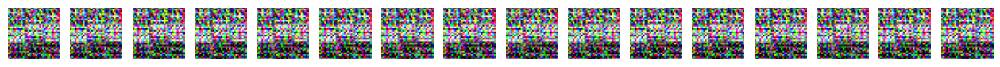

2024-11-04 22:30:25 | Batch 0/391 | d_loss: 1.7287 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:30:48 | Batch 100/391 | d_loss: 1.7058 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:31:12 | Batch 200/391 | d_loss: 1.7346 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:31:35 | Batch 300/391 | d_loss: 1.7307 | g_loss: 0.3133 (after 2 updates)


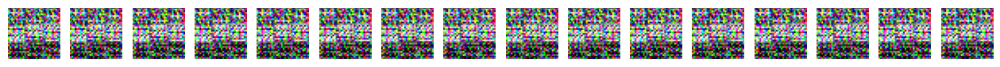

2024-11-04 22:32:23 | Batch 0/391 | d_loss: 1.7279 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:32:46 | Batch 100/391 | d_loss: 1.7028 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:33:09 | Batch 200/391 | d_loss: 1.7033 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:33:32 | Batch 300/391 | d_loss: 1.7290 | g_loss: 0.3133 (after 2 updates)


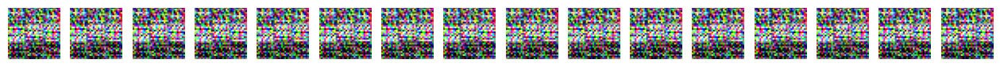

2024-11-04 22:34:20 | Batch 0/391 | d_loss: 1.7293 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:34:44 | Batch 100/391 | d_loss: 1.7324 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:35:07 | Batch 200/391 | d_loss: 1.7312 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:35:31 | Batch 300/391 | d_loss: 1.7282 | g_loss: 0.3133 (after 2 updates)


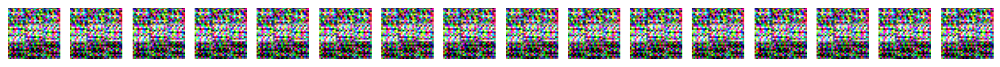

2024-11-04 22:36:19 | Batch 0/391 | d_loss: 1.7221 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:36:43 | Batch 100/391 | d_loss: 1.7215 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:37:06 | Batch 200/391 | d_loss: 1.7412 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:37:30 | Batch 300/391 | d_loss: 1.7604 | g_loss: 0.3133 (after 2 updates)


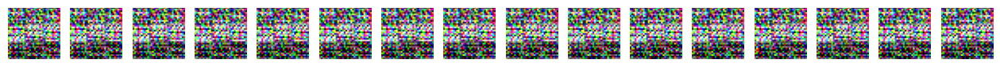

2024-11-04 22:38:18 | Batch 0/391 | d_loss: 1.7044 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:38:42 | Batch 100/391 | d_loss: 1.7153 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:39:06 | Batch 200/391 | d_loss: 1.7262 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:39:29 | Batch 300/391 | d_loss: 1.7262 | g_loss: 0.3133 (after 2 updates)


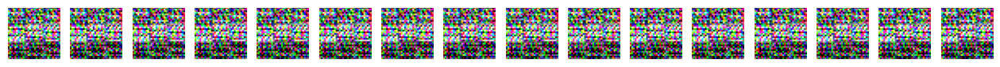

2024-11-04 22:40:17 | Batch 0/391 | d_loss: 1.7311 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:40:40 | Batch 100/391 | d_loss: 1.7310 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:41:04 | Batch 200/391 | d_loss: 1.7186 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:41:27 | Batch 300/391 | d_loss: 1.7150 | g_loss: 0.3133 (after 2 updates)


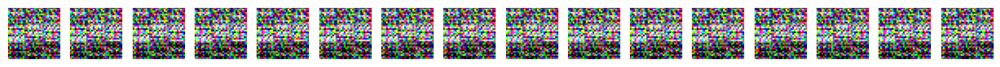

2024-11-04 22:42:15 | Batch 0/391 | d_loss: 1.7207 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:42:38 | Batch 100/391 | d_loss: 1.7069 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:43:01 | Batch 200/391 | d_loss: 1.7101 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:43:25 | Batch 300/391 | d_loss: 1.7277 | g_loss: 0.3133 (after 2 updates)


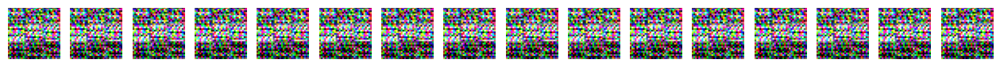

2024-11-04 22:44:13 | Batch 0/391 | d_loss: 1.6996 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:44:37 | Batch 100/391 | d_loss: 1.7297 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:45:01 | Batch 200/391 | d_loss: 1.7331 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:45:24 | Batch 300/391 | d_loss: 1.7258 | g_loss: 0.3133 (after 2 updates)


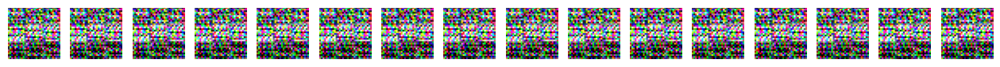

2024-11-04 22:46:12 | Batch 0/391 | d_loss: 1.7288 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:46:35 | Batch 100/391 | d_loss: 1.7256 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:46:58 | Batch 200/391 | d_loss: 1.7326 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:47:22 | Batch 300/391 | d_loss: 1.7201 | g_loss: 0.3133 (after 2 updates)


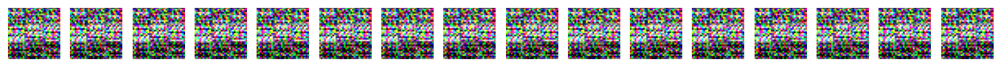

2024-11-04 22:48:10 | Batch 0/391 | d_loss: 1.7261 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:48:33 | Batch 100/391 | d_loss: 1.7228 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:48:56 | Batch 200/391 | d_loss: 1.7265 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:49:19 | Batch 300/391 | d_loss: 1.7414 | g_loss: 0.3133 (after 2 updates)


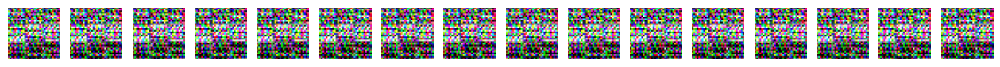

2024-11-04 22:50:07 | Batch 0/391 | d_loss: 1.7081 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:50:30 | Batch 100/391 | d_loss: 1.7262 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:50:53 | Batch 200/391 | d_loss: 1.7331 | g_loss: 0.3133 (after 2 updates)
2024-11-04 22:51:16 | Batch 300/391 | d_loss: 1.7437 | g_loss: 0.3133 (after 2 updates)


In [31]:
trainer.train(
    num_epochs=100,
    smooth=True,
    patience=patience,
    view_samples=True,
    g_updates=g_updates,
    label_noise=label_noise,
    instance_noise=instance_noise,
)

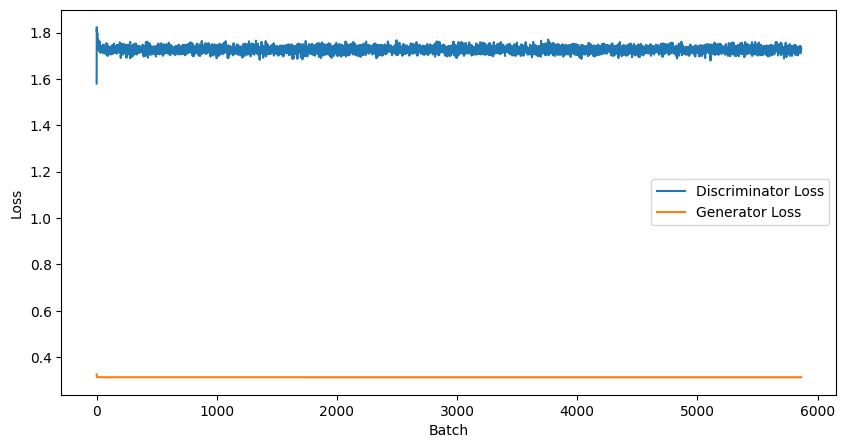

In [32]:
# Plot the trainer metrics
trainer.plot_metrics()

# Future Development

To improve GAN stability and training convergence, consider implementing the following advanced techniques:

1. Switch to WGAN-GP (Wasserstein GAN with Gradient Penalty):
    - WGAN-GP often provides more stable training by minimizing the Wasserstein distance, making it a good alternative to binary cross-entropy loss for GANs. The gradient penalty helps maintain balance by constraining the discriminator and improving stability.
2. Learning Rate Warmup for the Generator:
    - Gradually increasing the generator’s learning rate can help stabilize its performance early in training. Start with a lower learning rate (e.g., 0.00001) and gradually increase it to the target rate over the first few epochs.
3. Adjust Balance Between Discriminator and Generator Training:
    - Alternating update cycles (e.g., 1 generator update for every 2 discriminator updates) can prevent imbalances and may help improve overall training performance.
4. Implement Feature Matching Loss in the Generator:
	- Adding a feature matching loss encourages the generator to match intermediate layer activations of the discriminator, reducing mode collapse and promoting diversity in generated samples.
5. Increase Gradient Penalty (λ) in WGAN-GP:
    - The standard gradient penalty coefficient (e.g., λ=10) can be increased (e.g., λ=20 or λ=50) to strengthen the constraint on the discriminator, enhancing stability at the cost of potentially slower convergence.
6. Use Exponential Moving Average (EMA) for Generator Weights:
	- EMA of generator weights can help create a stable version of the generator over time. Applying a decay factor (e.g., 0.999) at the end of each epoch helps maintain stability and can improve sample quality for visual evaluation.

Each of these strategies can help improve the training process, reduce instability, and ultimately enhance the quality and diversity of generated samples.